In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as  plt
import cv2
import os
import tensorflow as tf
from tensorflow.keras.layers import Dense,Dropout,BatchNormalization,Conv2D,MaxPooling2D,Flatten,InputLayer,Input
from tensorflow.keras.callbacks import EarlyStopping,LearningRateScheduler,ModelCheckpoint
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.optimizers import Adam,SGD
from tensorflow.keras.applications import ResNet152V2,DenseNet121,InceptionResNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.metrics import Accuracy,TruePositives,TrueNegatives,FalseNegatives,FalsePositives
from tensorflow.keras.regularizers import L2
from sklearn.metrics import confusion_matrix,classification_report,roc_curve,roc_auc_score
import warnings
warnings.filterwarnings("ignore")
import glob
import yaml
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications import ResNet50

In [3]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


#first of all im gonna check the data

In [ ]:
subfolder = ['Tulip','sunflower','rose','dandelion','daisy']

directory = {
    Data_dir : 'Data'
}

for dir, name in directory.items() :
    total = 0
    for sub in subfolder :
        path = os.path.join(dir, sub)
        hitung = len([foto for foto in os.listdir(path) if os.path.join(path, foto)])
        total += hitung
        print(f'label {sub} punya jumlah foto sebanyak : {total}')

NameError: name 'Data_dir' is not defined

In [ ]:
import os
import shutil
import random

# Direktori dataset
data_dir = "C:/Users/Owen/Downloads/Flower/flowers"  # Folder utama yang punya subfolder
train_dir = "C:/Users/Owen/Downloads/Flower/flowers/Train"   # Folder tujuan untuk train
test_dir = "C:/Users/Owen/Downloads/Flower/flowers/test"     # Folder tujuan untuk test

# Subfolder yang ada di data_dir
subfolders = ['Tulip', 'sunflower', 'rose', 'dandelion', 'daisy']

# Pastikan folder tujuan ada (dengan subfolder)
for sub in subfolders:
    os.makedirs(os.path.join(train_dir, sub), exist_ok=True)
    os.makedirs(os.path.join(test_dir, sub), exist_ok=True)

# Loop untuk setiap subfolder
for sub in subfolders:
    # Dapatkan semua gambar di subfolder
    subfolder_path = os.path.join(data_dir, sub)
    all_images = [f for f in os.listdir(subfolder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]

    # Acak urutan gambar
    random.shuffle(all_images)

    # Tentukan proporsi train-test (80%-20%)
    split_index = int(0.8 * len(all_images))
    train_images = all_images[:split_index]
    test_images = all_images[split_index:]

    # Fungsi untuk memindahkan gambar
    def move_files(image_list, source_dir, target_dir):
        for img in image_list:
            source_path = os.path.join(source_dir, img)
            target_path = os.path.join(target_dir, img)
            shutil.move(source_path, target_path)

    # Pindahkan train set
    move_files(train_images, subfolder_path, os.path.join(train_dir, sub))

    # Pindahkan test set
    move_files(test_images, subfolder_path, os.path.join(test_dir, sub))

    print(f"Subfolder '{sub}':")
    print(f"  Total Train Images: {len(train_images)}")
    print(f"  Total Test Images: {len(test_images)}")

print("Proses split selesai!")

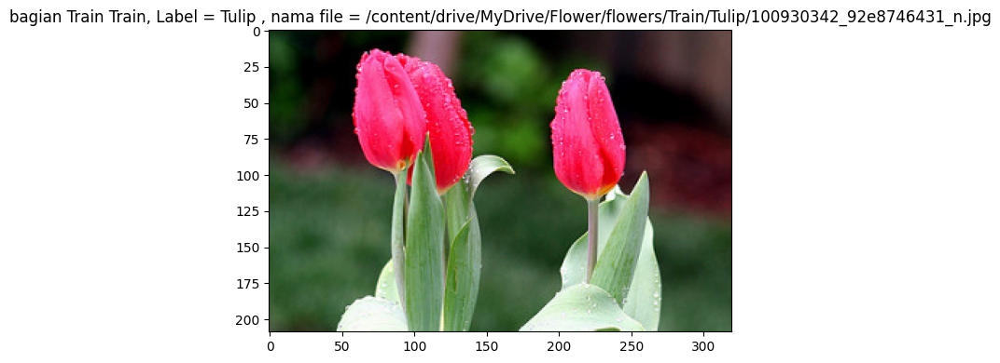

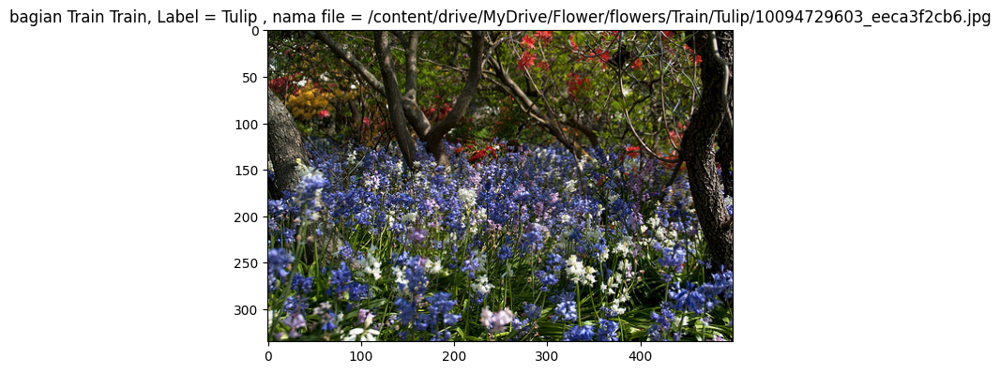

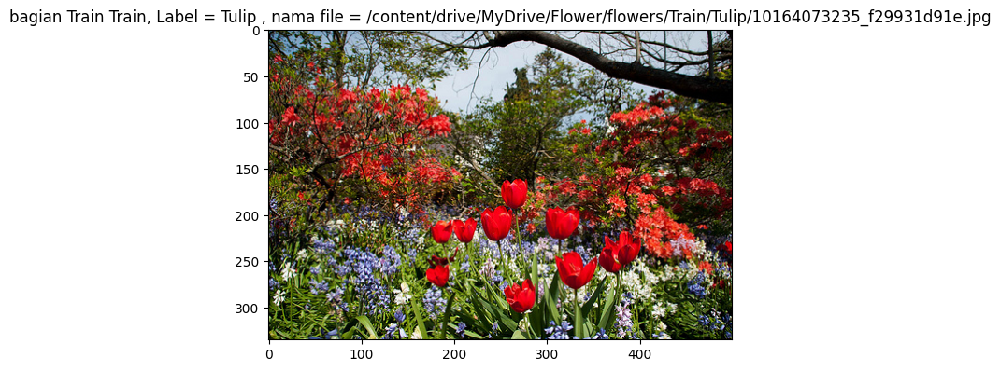

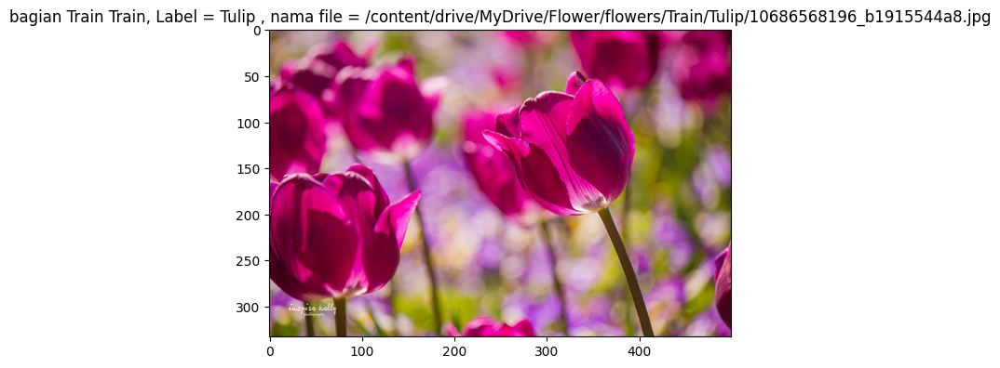

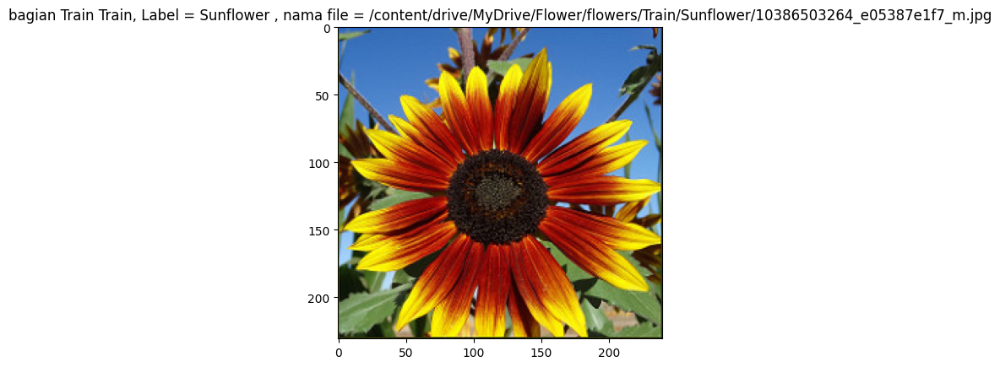

...

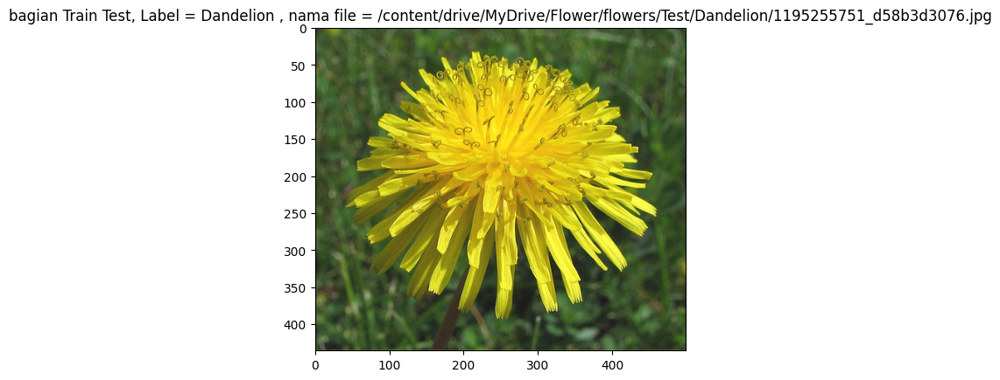

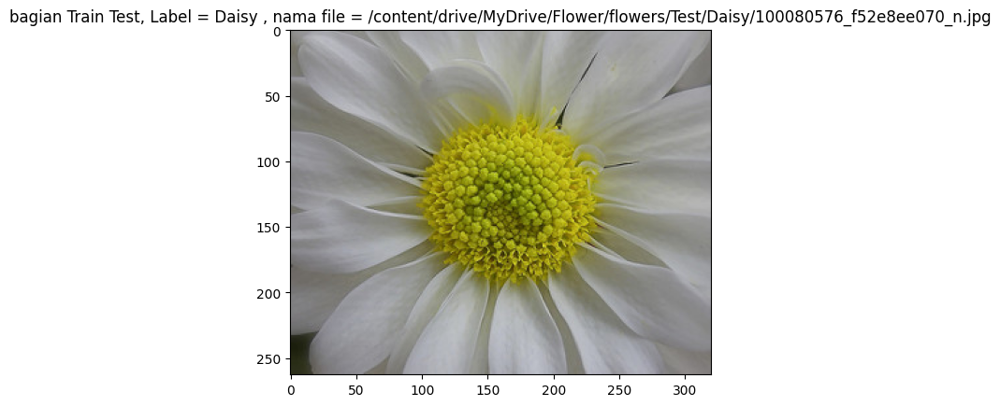

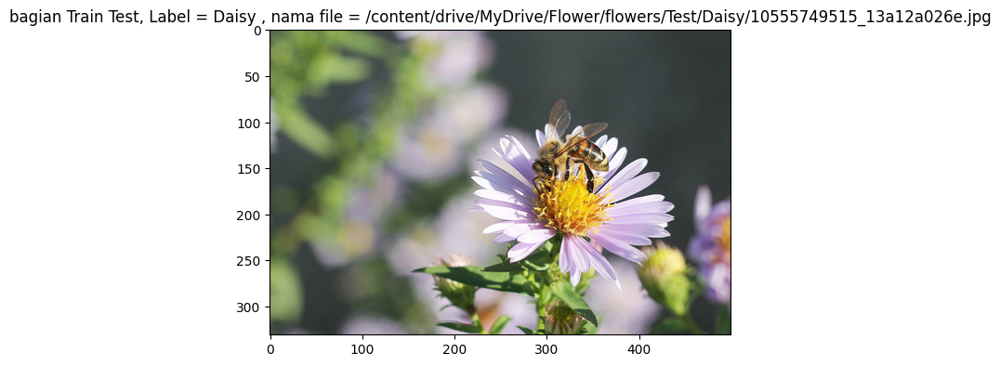

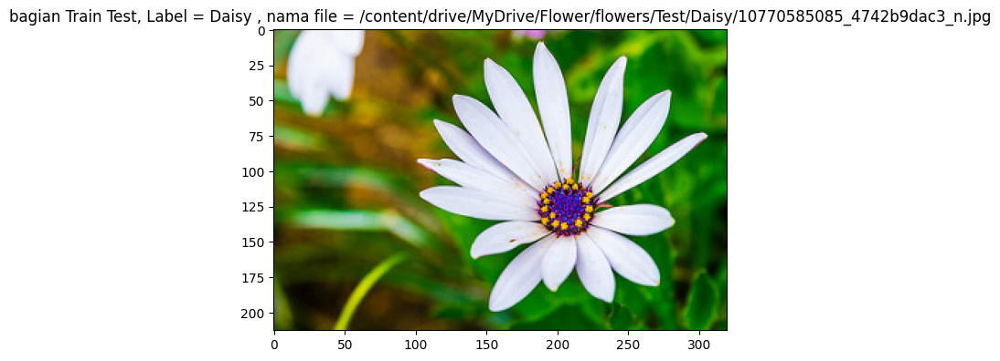

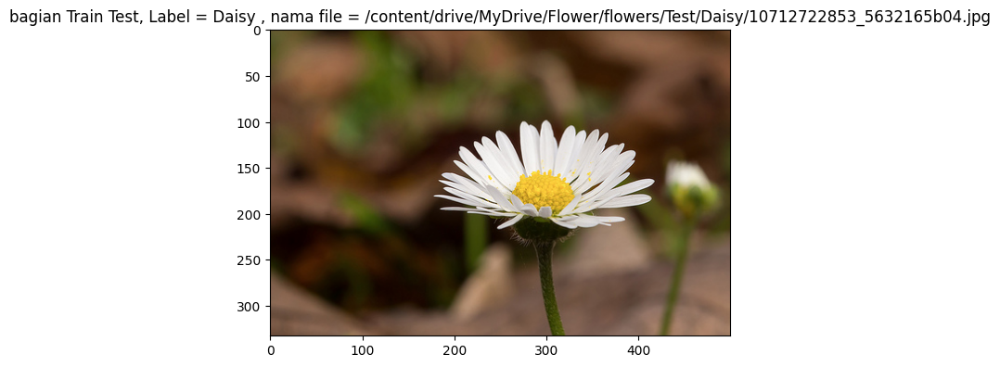

In [ ]:
import matplotlib.image as mpimg
subfolder = ['Tulip','Sunflower','Rose','Dandelion','Daisy']

train_dir = "/content/drive/MyDrive/Flower/flowers/Train"
test_dir = "/content/drive/MyDrive/Flower/flowers/Test"

directory = {
    train_dir  : 'Train',
    test_dir   : 'Test'
}

for folder,name in directory.items() :
    for sub in subfolder:
        a = os.path.join(folder, sub)
        for foto in os.listdir(a)[:4] :
            image_path = os.path.join(a, foto)
            image = mpimg.imread(image_path)
            plt.imshow(image)
            plt.title(f"bagian Train {name}, Label = {sub} , nama file = {image_path}")
            plt.axis()
            plt.show()

In [ ]:
for dir, name in directory.items() :
    total = 0
    for sub in subfolder :
        path = os.path.join(dir,sub)
        a = len([foto for foto in os.listdir(path) if os.path.join(path,foto)])
        total += a
        print(f' Data {name} Pada subfolder {sub} memiliki jumlah = {total}')
    print('-'*10)

 Data Train Pada subfolder Tulip memiliki jumlah = 797
 Data Train Pada subfolder Sunflower memiliki jumlah = 1383
 Data Train Pada subfolder Rose memiliki jumlah = 2010
 Data Train Pada subfolder Dandelion memiliki jumlah = 2861
 Data Train Pada subfolder Daisy memiliki jumlah = 3472
----------
 Data Test Pada subfolder Tulip memiliki jumlah = 197
 Data Test Pada subfolder Sunflower memiliki jumlah = 344
 Data Test Pada subfolder Rose memiliki jumlah = 501
 Data Test Pada subfolder Dandelion memiliki jumlah = 712
 Data Test Pada subfolder Daisy memiliki jumlah = 865
----------


In [ ]:
from collections import defaultdict
from PIL import Image

dims_counts = defaultdict(int)

for dir, name in directory.items() :
    for sub in subfolder :
        path = os.path.join(dir, sub)
        for file in os.listdir(path) :
            path_file = os.path.join(path,file)
            with Image.open(path_file) as img:
                dims_counts[img.size] += 1

for dimension, count in dims_counts.items() :
    print(f"dimension {dimension} = {count}")

NameError: name 'directory' is not defined

In [16]:
train_dir = "/content/drive/MyDrive/Flower/flowers/Train"
test_dir = "/content/drive/MyDrive/Flower/flowers/Test"
seed = 123
Train = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    labels = 'inferred',
    label_mode = 'categorical',
    class_names = ['Tulip', 'Sunflower', 'Rose', 'Dandelion', 'Daisy'],
    batch_size = 16,
    shuffle = True,
    seed = seed,
    image_size = (256,256),
    validation_split = 0,
    crop_to_aspect_ratio = True
)

Found 3472 files belonging to 5 classes.


In [17]:
seed = 123
Test = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    labels = 'inferred',
    label_mode = 'categorical',
    class_names = ['Tulip', 'Sunflower', 'Rose', 'Dandelion', 'Daisy'],
    batch_size = 16,
    shuffle = True,
    image_size = (256,256),
    seed = seed,
    validation_split = 0,
    crop_to_aspect_ratio = True
)

Found 865 files belonging to 5 classes.


In [6]:
min_value = float('inf')
max_value = -float('inf')

for img, label in Test:
    batch_min = tf.reduce_min(img)
    batch_max = tf.reduce_max(img)

    min_value = min(min_value, batch_min.numpy())
    max_value = max(max_value, batch_max.numpy())

print('\nMinimum pixel value in the Validation dataset', min_value)
print('\nMaximum pixel value in the Validation dataset', max_value)

KeyboardInterrupt: 

In [18]:
from keras.layers import Rescaling

scaler = Rescaling(1./255)

In [19]:
Train = Train.map(lambda x, y: (scaler(x), y))
Test = Test.map(lambda x, y: (scaler(x), y))

In [20]:
augmentation = tf.keras.Sequential(
    [
        tf.keras.layers.RandomRotation(
        factor = (-.25, .3),
        fill_mode = 'reflect',
        interpolation = 'bilinear',
        seed = seed),


        tf.keras.layers.RandomBrightness(
        factor = (-.45, .45),
        value_range = (0.0, 1.0),
        seed = seed),

        tf.keras.layers.RandomContrast(
        factor = (.5),
        seed = seed)
    ]
)

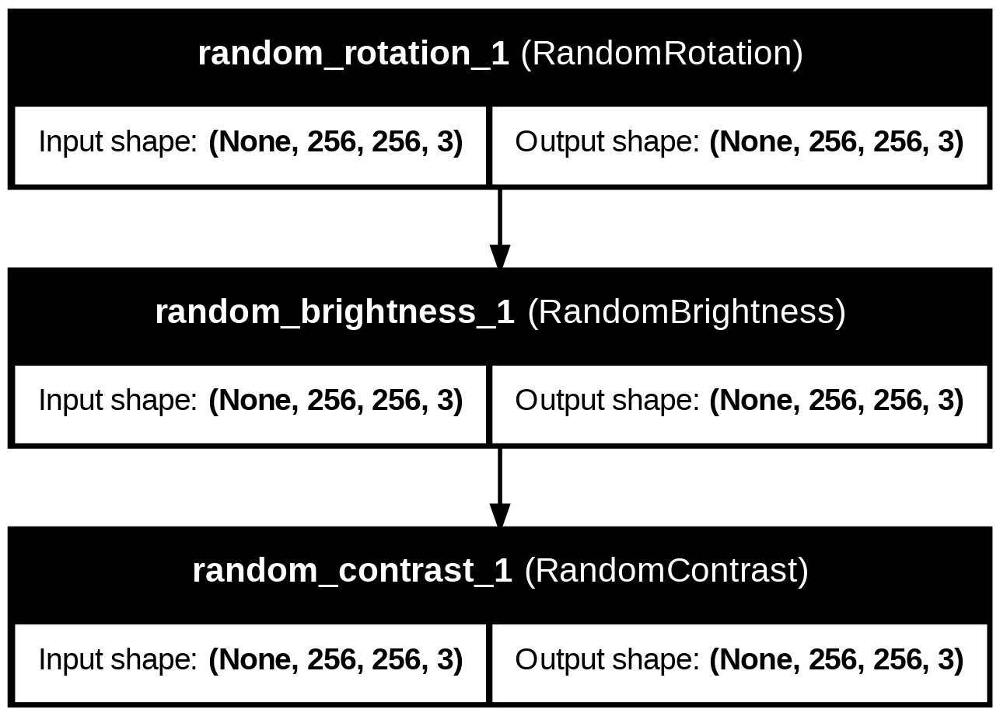

In [21]:
augmentation.build((None, 256, 256, 3)) # Building model
# Plotting model
tf.keras.utils.plot_model(augmentation,
                          show_shapes = True,
                          show_layer_names = True,
                          expand_nested = True)

In [22]:
from keras.models import Sequential                          # Neural network model as a sequence of layers.
from keras.layers import Conv2D                              # Convolutional layer
from keras.layers import MaxPooling2D                        # Max pooling layer
from keras.layers import Flatten                             # Layer used to flatten 2D arrays for fully-connected layers.
from keras.layers import Dense                               # This layer adds fully-connected layers to the neural network.
from keras.layers import Dropout                             # This serves to prevent overfitting by dropping out a random set of activations.
from keras.layers import BatchNormalization                  # This is used to normalize the activations of the neurons.
from keras.layers import Activation                          # Layer for activation functions
from keras.callbacks import EarlyStopping, ModelCheckpoint   # Classes used to save weights and stop training when improvements reach a limit
from keras.models import load_model

In [ ]:
model = Sequential()
model.add(Conv2D(32,
                 (3,3),
                 strides = 1,
                 padding = 'same',
                 input_shape = (256,256,3)
                ))

model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.3))

model.add(Conv2D(64, (3,3), strides = 1, padding = 'same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.3))

model.add(Conv2D(128, (3,3), strides = 1, padding = 'same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.3))

model.add(Conv2D(256, (3,3), strides = 1, padding = 'same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.3))

model.add(Flatten())

model.add(Dense(64))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(32))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(5, activation = 'softmax'))

In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 256, 256, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 256, 256, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 256, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 128, 128, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 4,587,333 (17.50 MB)

 Trainable params: 4,586,181 (17.49 MB)

 Non-trainable params: 1,152 (4.50 KB)

In [ ]:
model.compile(
    optimizer = tf.keras.optimizers.RMSprop(0.0001),
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

early_stopping = EarlyStopping(monitor = 'val_accuracy',
                              patience = 5, mode = 'max',
                              restore_best_weights = True)

checkpoint = ModelCheckpoint('best_model.keras',
                            monitor = 'val_accuracy',
                            save_best_only = True)

In [ ]:
try:
    history = model.fit(
        Train, epochs = 50,
        validation_data = Test,
        callbacks = [early_stopping, checkpoint])
except Exception as e:
    print("An error occurred:", e)

Epoch 1/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 385s 2s/step - accuracy: 0.3327 - loss: 1.8154 - val_accuracy: 0.2289 - val_loss: 7.0442
Epoch 2/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - accuracy: 0.4406 - loss: 1.4766 - val_accuracy: 0.2809 - val_loss: 5.9762
Epoch 3/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - accuracy: 0.4738 - loss: 1.3529 - val_accuracy: 0.3145 - val_loss: 9.4147
Epoch 4/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - accuracy: 0.5006 - loss: 1.2826 - val_accuracy: 0.2254 - val_loss: 18.3321
Epoch 5/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - accuracy: 0.5314 - loss: 1.2092 - val_accuracy: 0.2185 - val_loss: 18.8025
Epoch 6/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - accuracy: 0.5424 - loss: 1.1817 - val_accuracy: 0.2578 - val_loss: 15.9635
Epoch 7/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - accuracy: 0.5644 - loss: 1.1237 - val_accuracy: 0.2543 - val_loss: 11.5474
Epoch 8/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - accuracy: 0.6139 - loss: 1.0233

In [ ]:
model = Sequential()
model.add(Conv2D(32,
                 (3,3),
                 strides = 1,
                 padding = 'same',
                 input_shape = (256,256,3)
                ))

model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.3))

model.add(Conv2D(64, (3,3), strides = 1, padding = 'same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.3))

model.add(Conv2D(128, (3,3), strides = 1, padding = 'same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.3))

model.add(Flatten())

model.add(Dense(64))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(32))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(5, activation = 'softmax'))

In [ ]:
model.compile(
    optimizer = tf.keras.optimizers.RMSprop(0.0001),
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

early_stopping = EarlyStopping(monitor = 'val_accuracy',
                              patience = 5, mode = 'max',
                              restore_best_weights = True)

checkpoint = ModelCheckpoint('best_model.keras',
                            monitor = 'val_accuracy',
                            save_best_only = True)

NameError: name 'model' is not defined

In [ ]:
try:
    history = model.fit(
        Train, epochs = 50,
        validation_data = Test,
        callbacks = [early_stopping, checkpoint])
except Exception as e:
    print("An error occurred:", e)

Epoch 1/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - accuracy: 0.3369 - loss: 1.7607 - val_accuracy: 0.1815 - val_loss: 7.8630
Epoch 2/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - accuracy: 0.4291 - loss: 1.4457 - val_accuracy: 0.2335 - val_loss: 8.2196
Epoch 3/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - accuracy: 0.4958 - loss: 1.2773 - val_accuracy: 0.2312 - val_loss: 9.1482
Epoch 4/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step - accuracy: 0.5484 - loss: 1.1681 - val_accuracy: 0.2786 - val_loss: 8.0066
Epoch 5/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step - accuracy: 0.5785 - loss: 1.0725 - val_accuracy: 0.2994 - val_loss: 11.2417
Epoch 6/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - accuracy: 0.6186 - loss: 0.9841 - val_accuracy: 0.3526 - val_loss: 9.8677
Epoch 7/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step - accuracy: 0.6243 - loss: 0.9256 - val_accuracy: 0.3676 - val_loss: 8.3637
Epoch 8/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - accuracy: 0.6658 - loss: 0.8631 -

In [ ]:
model = Sequential()
model.add(augmentation)
model.add(Conv2D(32,
                 (3,3),
                 strides = 1,
                 padding = 'same',
                 input_shape = (256,256,3)
                ))

model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.2))

model.add(Conv2D(64, (3,3), strides = 1, padding = 'same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.2))

model.add(Conv2D(128, (3,3), strides = 1, padding = 'same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.3))

model.add(Flatten())

model.add(Dense(64))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Dense(32))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(5, activation = 'softmax'))

model.compile(
    optimizer = tf.keras.optimizers.RMSprop(0.0001),
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

early_stopping = EarlyStopping(monitor = 'val_accuracy',
                              patience = 5, mode = 'max',
                              restore_best_weights = True)

checkpoint = ModelCheckpoint('best_model.keras',
                            monitor = 'val_accuracy',
                            save_best_only = True)

try:
    history = model.fit(
        Train, epochs = 50,
        validation_data = Test,
        callbacks = [early_stopping, checkpoint])
except Exception as e:
    print("An error occurred:", e)

Epoch 1/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 33s 122ms/step - accuracy: 0.3179 - loss: 1.9023 - val_accuracy: 0.1815 - val_loss: 14.4571
Epoch 2/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - accuracy: 0.4211 - loss: 1.5685 - val_accuracy: 0.1734 - val_loss: 17.1891
Epoch 3/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - accuracy: 0.4231 - loss: 1.5162 - val_accuracy: 0.2462 - val_loss: 12.3169
Epoch 4/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - accuracy: 0.4592 - loss: 1.4291 - val_accuracy: 0.3387 - val_loss: 7.8062
Epoch 5/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - accuracy: 0.4771 - loss: 1.3644 - val_accuracy: 0.3376 - val_loss: 7.0747
Epoch 6/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - accuracy: 0.4881 - loss: 1.3100 - val_accuracy: 0.2936 - val_loss: 8.8828
Epoch 7/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 42s 128ms/step - accuracy: 0.4702 - loss: 1.3527 - val_accuracy: 0.3549 - val_loss: 3.8842
Epoch 8/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - accuracy: 0.4873 - loss

KeyboardInterrupt: 

In [ ]:
model = Sequential()
model.add(augmentation)
model.add(Conv2D(32,
                 (3,3),
                 strides = 1,
                 padding = 'same',
                 input_shape = (256,256,3)
                ))

model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.1))

model.add(Conv2D(64, (3,3), strides = 1, padding = 'same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.15))

model.add(Conv2D(128, (3,3), strides = 1, padding = 'same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.1))

model.add(Flatten())

model.add(Dense(32))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(64))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(5, activation = 'softmax'))

model.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005),
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

early_stopping = EarlyStopping(monitor = 'val_accuracy',
                              patience = 5, mode = 'max',
                              restore_best_weights = True)

checkpoint = ModelCheckpoint('best_model.keras',
                            monitor = 'val_accuracy',
                            save_best_only = True)

try:
    history = model.fit(
        Train, epochs = 50,
        validation_data = Test,
        callbacks = [early_stopping, checkpoint])
except Exception as e:
    print("An error occurred:", e)

Epoch 1/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 1049s 5s/step - accuracy: 0.3021 - loss: 1.8813 - val_accuracy: 0.2601 - val_loss: 1.8971
Epoch 2/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - accuracy: 0.3618 - loss: 1.6091 - val_accuracy: 0.3191 - val_loss: 1.8633
Epoch 3/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - accuracy: 0.4063 - loss: 1.4345 - val_accuracy: 0.3699 - val_loss: 1.4396
Epoch 4/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - accuracy: 0.4350 - loss: 1.3524 - val_accuracy: 0.4347 - val_loss: 1.3431
Epoch 5/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - accuracy: 0.4483 - loss: 1.3194 - val_accuracy: 0.4717 - val_loss: 1.2118
Epoch 6/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - accuracy: 0.4556 - loss: 1.2881 - val_accuracy: 0.4474 - val_loss: 1.3000
Epoch 7/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 27s 121ms/step - accuracy: 0.4468 - loss: 1.3213 - val_accuracy: 0.4971 - val_loss: 1.1828
Epoch 8/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - accuracy: 0.4966 - loss: 1.

In [ ]:
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential_2 (Sequential)            │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 256, 256, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_14 (Activation)           │ (None, 256, 256, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_14               │ (None, 256, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_14 (Dropout)                 │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 128, 128, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_15 (Activation)           │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_15               │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_16 (Activation)           │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_16               │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_16 (Dropout)                 │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 131072)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 32)                  │       4,194,336 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_17 (Activation)           │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_17               │ (None, 32)                  │             1

 Total params: 4,288,608 (16.36 MB)

 Trainable params: 4,288,096 (16.36 MB)

 Non-trainable params: 512 (2.00 KB)

In [ ]:
model = Sequential()
model.add(augmentation)
model.add(Conv2D(32,
                 (3,3),
                 strides = 1,
                 padding = 'same',
                 input_shape = (256,256,3)
                ))

model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.1))

model.add(Conv2D(64, (3,3), strides = 1, padding = 'same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.15))

model.add(Conv2D(128, (3,3), strides = 1, padding = 'same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.1))

model.add(Flatten())

model.add(Dense(32))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(5, activation = 'softmax'))

model.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005),
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

early_stopping = EarlyStopping(monitor = 'val_accuracy',
                              patience = 5, mode = 'max',
                              restore_best_weights = True)

checkpoint = ModelCheckpoint('best_model.keras',
                            monitor = 'val_accuracy',
                            save_best_only = True)

try:
    history = model.fit(
        Train, epochs = 50,
        validation_data = Test,
        callbacks = [early_stopping, checkpoint])
except Exception as e:
    print("An error occurred:", e)

Epoch 1/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 33s 128ms/step - accuracy: 0.3581 - loss: 1.6619 - val_accuracy: 0.2624 - val_loss: 2.4496
Epoch 2/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - accuracy: 0.4660 - loss: 1.3538 - val_accuracy: 0.3364 - val_loss: 1.7460
Epoch 3/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 27s 122ms/step - accuracy: 0.4784 - loss: 1.2910 - val_accuracy: 0.4069 - val_loss: 1.4310
Epoch 4/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - accuracy: 0.5028 - loss: 1.2584 - val_accuracy: 0.5168 - val_loss: 1.2091
Epoch 5/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - accuracy: 0.5374 - loss: 1.1911 - val_accuracy: 0.5399 - val_loss: 1.1552
Epoch 6/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 43s 128ms/step - accuracy: 0.5371 - loss: 1.1380 - val_accuracy: 0.5584 - val_loss: 1.1248
Epoch 7/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - accuracy: 0.5674 - loss: 1.0607 - val_accuracy: 0.4994 - val_loss: 1.3922
Epoch 8/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - accuracy: 0.5741 - loss: 1

In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau

lr_scheduler = ReduceLROnPlateau(
    monitor='val_accuracy',
    factor=0.5,
    patience=3,
    min_lr=1e-6
)


model = Sequential()
model.add(augmentation)
model.add(Conv2D(32,
                 (3,3),
                 strides = 1,
                 padding = 'same',
                 input_shape = (256,256,3)
                ))

model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.1))

model.add(Conv2D(64, (3,3), strides = 1, padding = 'same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.15))

model.add(Conv2D(128, (3,3), strides = 1, padding = 'same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
model.add(Dropout(0.1))

model.add(Flatten())

model.add(Dense(32))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(5, activation = 'softmax'))

model.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005),
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

early_stopping = EarlyStopping(monitor = 'val_accuracy',
                              patience = 5, mode = 'max',
                              restore_best_weights = True)

checkpoint = ModelCheckpoint('best_model.keras',
                            monitor = 'val_accuracy',
                            save_best_only = True)



try:
    history = model.fit(
        Train, epochs = 50,
        validation_data = Test,
        callbacks = [early_stopping, checkpoint,lr_scheduler])
except Exception as e:
    print("An error occurred:", e)

Epoch 1/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - accuracy: 0.3696 - loss: 1.6259 - val_accuracy: 0.2809 - val_loss: 6.6816 - learning_rate: 5.0000e-04
Epoch 2/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - accuracy: 0.4100 - loss: 1.4346 - val_accuracy: 0.2960 - val_loss: 3.0866 - learning_rate: 5.0000e-04
Epoch 3/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - accuracy: 0.4862 - loss: 1.2841 - val_accuracy: 0.3584 - val_loss: 1.7055 - learning_rate: 5.0000e-04
Epoch 4/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - accuracy: 0.4742 - loss: 1.2789 - val_accuracy: 0.4913 - val_loss: 1.1939 - learning_rate: 5.0000e-04
Epoch 5/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 26s 118ms/step - accuracy: 0.5326 - loss: 1.1637 - val_accuracy: 0.5549 - val_loss: 1.1032 - learning_rate: 5.0000e-04
Epoch 6/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - accuracy: 0.5489 - loss: 1.0937 - val_accuracy: 0.4740 - val_loss: 1.2783 - learning_rate: 5.0000e-04
Epoch 7/50
217/217 ━━━━━━━━━━━━━━━━━━━━ 41s 12

I think its the best that CNN can do, so I think it would be better if I use Pre Trained Model because my data is so small

In [ ]:
#I decided to use MobilleNetV2 & EfficientNetB0 because its simple and good for small dataset

Mobile_backbone = MobileNetV2(input_shape = (256,256,3), include_top = False, weights = 'imagenet')
Mobile_backbone.trainable = False

inputs = Input(shape = (256,256,3))
X = Mobile_backbone(inputs)
X = GlobalAveragePooling2D()(X)
X = Dense(32, activation = 'relu')(X)
X = BatchNormalization()(X)
outputs = Dense(5, activation = 'softmax')(X)

Mobile_model = Model(inputs, outputs, name = 'Mobile_model')
Mobile_model.compile(
    loss=BinaryCrossentropy(),
    optimizer = Adam(learning_rate=0.001),
    metrics = ['accuracy']
)

history = Mobile_model.fit(
    Train,
    validation_data = Test,
    epochs = 25,
    callbacks = [early_stopping, checkpoint]
)

Epoch 1/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 36s 118ms/step - accuracy: 0.6645 - loss: 0.5216 - val_accuracy: 0.8717 - val_loss: 0.2397
Epoch 2/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - accuracy: 0.8690 - loss: 0.2166 - val_accuracy: 0.8717 - val_loss: 0.1635
Epoch 3/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.9069 - loss: 0.1360 - val_accuracy: 0.8867 - val_loss: 0.1388
Epoch 4/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - accuracy: 0.9236 - loss: 0.1100 - val_accuracy: 0.8936 - val_loss: 0.1291
Epoch 5/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - accuracy: 0.9457 - loss: 0.0849 - val_accuracy: 0.8798 - val_loss: 0.1428
Epoch 6/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - accuracy: 0.9515 - loss: 0.0748 - val_accuracy: 0.8705 - val_loss: 0.1535
Epoch 7/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.9641 - loss: 0.0610 - val_accuracy: 0.8809 - val_loss: 0.1373
Epoch 8/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - accuracy: 0.9762 - loss: 0.0547 -

In [ ]:
#I decided to use MobilleNetV2 & EfficientNetB0 because its simple and good for small dataset
early_stopping = EarlyStopping(monitor = 'val_accuracy',
                              patience = 5, mode = 'max',
                              restore_best_weights = True)

checkpoint = ModelCheckpoint('best_model.keras',
                            monitor = 'val_accuracy',
                            save_best_only = True)

Mobile_backbone = MobileNetV2(input_shape = (256,256,3), include_top = False, weights = 'imagenet')
Mobile_backbone.trainable = False

inputs = Input(shape = (256,256,3))
X = Mobile_backbone(inputs)
X = GlobalAveragePooling2D()(X)
X = Dense(32, activation = 'relu')(X)
X = BatchNormalization()(X)
X = Dropout(0.3)(X)
outputs = Dense(5, activation = 'softmax')(X)

Mobile_model = Model(inputs, outputs, name = 'Mobile_model')
Mobile_model.compile(
    loss=BinaryCrossentropy(),
    optimizer = Adam(learning_rate=0.0001),
    metrics = ['accuracy']
)

history = Mobile_model.fit(
    Train,
    validation_data = Test,
    epochs = 25,
    callbacks = [early_stopping, checkpoint]
)

Epoch 1/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 751s 3s/step - accuracy: 0.3779 - loss: 0.7767 - val_accuracy: 0.7410 - val_loss: 0.5478
Epoch 2/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 76s 91ms/step - accuracy: 0.6759 - loss: 0.5754 - val_accuracy: 0.7954 - val_loss: 0.4569
Epoch 3/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step - accuracy: 0.7438 - loss: 0.5108 - val_accuracy: 0.8358 - val_loss: 0.4083
Epoch 4/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - accuracy: 0.7900 - loss: 0.4565 - val_accuracy: 0.8509 - val_loss: 0.3729
Epoch 5/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - accuracy: 0.7949 - loss: 0.4283 - val_accuracy: 0.8601 - val_loss: 0.3464
Epoch 6/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - accuracy: 0.8256 - loss: 0.3958 - val_accuracy: 0.8751 - val_loss: 0.3211
Epoch 7/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - accuracy: 0.8404 - loss: 0.3699 - val_accuracy: 0.8740 - val_loss: 0.3052
Epoch 8/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - accuracy: 0.8329 - loss: 0.3478 -

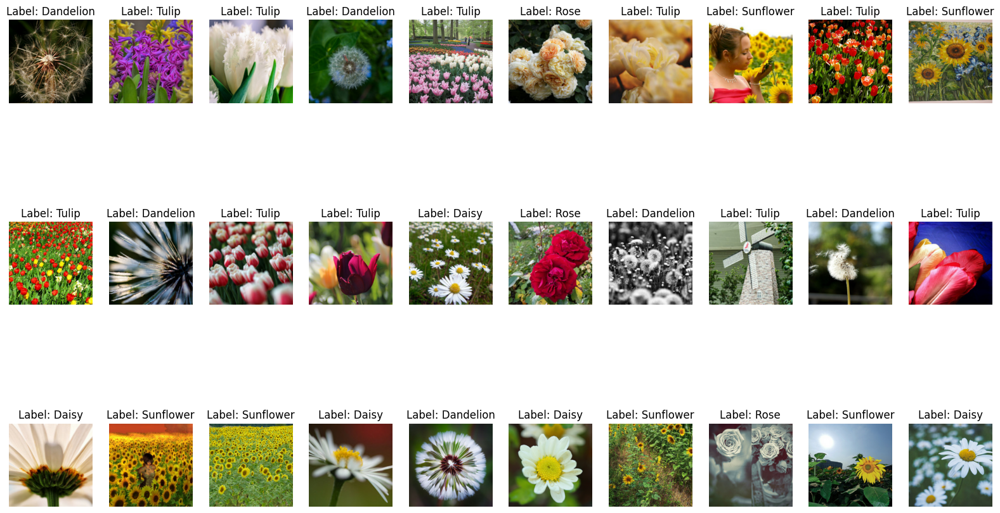

In [36]:
import matplotlib.pyplot as plt
import numpy as np

# Definisikan class_names
class_names = ['Tulip', 'Sunflower', 'Rose', 'Dandelion', 'Daisy']

# Tampilin 5 gambar pertama dari Test
plt.figure(figsize=(20, 20))
for i, (image, label) in enumerate(Test.unbatch().take(30)):
    plt.subplot(5, 10, i+1)
    plt.imshow(image.numpy())
    label_int = np.argmax(label.numpy())
    plt.title(f"Label: {class_names[label_int]}")
    plt.axis('off')
plt.show()

In [26]:
#I decided to use MobilleNetV2 & EfficientNetB0 because its simple and good for small dataset
early_stopping = EarlyStopping(monitor = 'val_accuracy',
                              patience = 5, mode = 'max',
                              restore_best_weights = True)

checkpoint = ModelCheckpoint('best_model.keras',
                            monitor = 'val_accuracy',
                            save_best_only = True)


Mobile_backbone = MobileNetV2(input_shape = (256,256,3), include_top = False, weights = 'imagenet')
Mobile_backbone.trainable = False

inputs = Input(shape = (256,256,3))
X = augmentation(inputs)
X = Mobile_backbone(X)
X = GlobalAveragePooling2D()(X)
X = Dense(32, activation = 'relu')(X)
X = BatchNormalization()(X)
outputs = Dense(5, activation = 'softmax')(X)

Mobile_model = Model(inputs, outputs, name = 'Mobile_model')
Mobile_model.compile(
    loss=BinaryCrossentropy(),
    optimizer = Adam(learning_rate=0.001),
    metrics = ['accuracy']
)

history = Mobile_model.fit(
    Train,
    validation_data = Test,
    epochs = 25,
    callbacks = [early_stopping, checkpoint]
)

Epoch 1/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 71s 274ms/step - accuracy: 0.6555 - loss: 0.5297 - val_accuracy: 0.8474 - val_loss: 0.3097
Epoch 2/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - accuracy: 0.8188 - loss: 0.2587 - val_accuracy: 0.8578 - val_loss: 0.1785
Epoch 3/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - accuracy: 0.8601 - loss: 0.1765 - val_accuracy: 0.8694 - val_loss: 0.1440
Epoch 4/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 23s 104ms/step - accuracy: 0.8622 - loss: 0.1632 - val_accuracy: 0.8763 - val_loss: 0.1414
Epoch 5/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - accuracy: 0.8685 - loss: 0.1454 - val_accuracy: 0.8636 - val_loss: 0.1395
Epoch 6/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - accuracy: 0.8863 - loss: 0.1354 - val_accuracy: 0.8543 - val_loss: 0.1426
Epoch 7/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step - accuracy: 0.8871 - loss: 0.1304 - val_accuracy: 0.8671 - val_loss: 0.1309
Epoch 8/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - accuracy: 0.8866 - loss: 0.125

In [28]:
#I decided to use MobilleNetV2 & EfficientNetB0 because its simple and good for small dataset
early_stopping = EarlyStopping(monitor = 'val_accuracy',
                              patience = 5, mode = 'max',
                              restore_best_weights = True)

checkpoint = ModelCheckpoint('best_model.keras',
                            monitor = 'val_accuracy',
                            save_best_only = True)


Mobile_backbone = MobileNetV2(input_shape = (256,256,3), include_top = False, weights = 'imagenet')
Mobile_backbone.trainable = False

inputs = Input(shape = (256,256,3))
X = augmentation(inputs)
X = Mobile_backbone(X)
X = GlobalAveragePooling2D()(X)
X = Dense(32, activation = 'relu')(X)
X = BatchNormalization()(X)
outputs = Dense(5, activation = 'softmax')(X)

Mobile_model = Model(inputs, outputs, name = 'Mobile_model')
Mobile_model.compile(
    loss=BinaryCrossentropy(),
    optimizer = Adam(learning_rate=0.0001),
    metrics = ['accuracy']
)

history = Mobile_model.fit(
    Train,
    validation_data = Test,
    epochs = 25,
    callbacks = [early_stopping, checkpoint]
)

Epoch 1/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 28s 104ms/step - accuracy: 0.3778 - loss: 0.7207 - val_accuracy: 0.6566 - val_loss: 0.5406
Epoch 2/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 39s 93ms/step - accuracy: 0.6673 - loss: 0.5503 - val_accuracy: 0.7503 - val_loss: 0.4767
Epoch 3/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - accuracy: 0.7367 - loss: 0.4857 - val_accuracy: 0.7954 - val_loss: 0.4435
Epoch 4/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - accuracy: 0.7839 - loss: 0.4403 - val_accuracy: 0.8162 - val_loss: 0.4086
Epoch 5/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - accuracy: 0.7892 - loss: 0.4048 - val_accuracy: 0.8243 - val_loss: 0.3654
Epoch 6/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - accuracy: 0.7973 - loss: 0.3759 - val_accuracy: 0.8439 - val_loss: 0.3465
Epoch 7/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - accuracy: 0.8168 - loss: 0.3492 - val_accuracy: 0.8335 - val_loss: 0.3141
Epoch 8/25
217/217 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - accuracy: 0.8210 - loss: 0.3226 -

In [14]:
import numpy as np
import matplotlib.pyplot as plt

# Hitung distribusi label
train_labels_list = [label for _, label in Train.unbatch().as_numpy_iterator()]
test_labels_list = [label for _, label in Test.unbatch().as_numpy_iterator()]

# Kalau labelnya one-hot encoded, konversi ke integer
if isinstance(train_labels_list[0], np.ndarray):  # Cek apakah one-hot
    train_labels_list = np.argmax(train_labels_list, axis=1)
    test_labels_list = np.argmax(test_labels_list, axis=1)

# Hitung jumlah per kelas
train_dist = np.bincount(train_labels_list)
test_dist = np.bincount(test_labels_list)

# Tampilin distribusi
print("Distribusi Training Set:", train_dist)
print("Distribusi Test Set:", test_dist)

# Visualisasi
plt.figure(figsize=(10, 5))
plt.bar(range(len(train_dist)), train_dist, alpha=0.7, label='Train')
plt.bar(range(len(test_dist)), test_dist, alpha=0.7, label='Test')
plt.xlabel('Kelas')
plt.ylabel('Jumlah Sampel')
plt.title('Distribusi Kelas')
plt.legend()
plt.show()

KeyboardInterrupt: 

Jumlah duplikat berdasarkan hash cepat: 1
Menampilkan contoh duplikat:


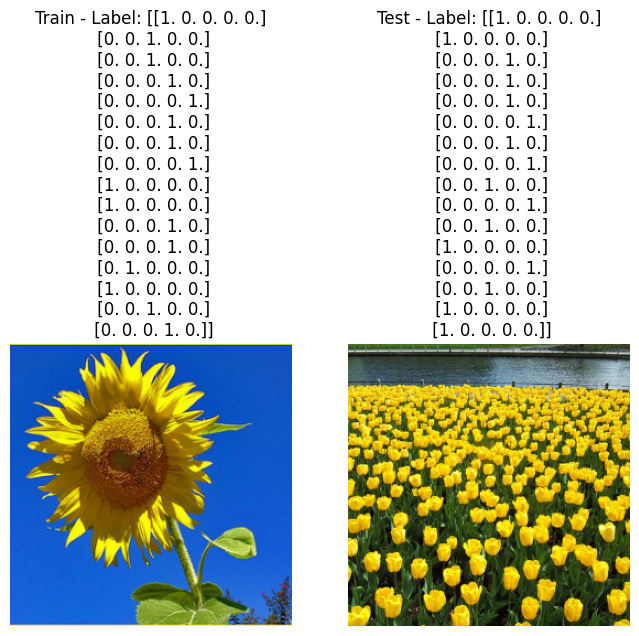

In [29]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Fungsi buat hash cepat pake tf (bukan imagehash)
def fast_hash(image):
    # Ubah gambar jadi 1D array dan hitung checksum sederhana
    flat_image = tf.reshape(image, [-1])
    return tf.reduce_sum(tf.cast(flat_image, tf.int32)).numpy()

# Ekstrak hash dan label secara paralel
def get_hashes_and_labels(dataset):
    hashes = []
    labels = []
    # Pakai map biar cepet
    def process(image, label):
        return fast_hash(image), label

    # Proses paralel pake tf.data
    mapped_dataset = dataset.map(
        lambda img, lbl: tf.py_function(process, [img, lbl], [tf.int64, lbl.dtype]),
        num_parallel_calls=tf.data.AUTOTUNE
    )

    for h, l in mapped_dataset:
        hashes.append(h.numpy())
        labels.append(l.numpy())
    return hashes, labels

# Ambil data dari Train dan Test (asumsi udah didefinisikan)
train_hashes, train_labels = get_hashes_and_labels(Train)
test_hashes, test_labels = get_hashes_and_labels(Test)

# Cek duplikat pake set
duplicates = set(train_hashes) & set(test_hashes)
print(f"Jumlah duplikat berdasarkan hash cepat: {len(duplicates)}")

# Tampilin gambar duplikat (ambil dari dataset asli)
if duplicates:
    print("Menampilkan contoh duplikat:")
    train_images = [img for img, _ in Train.unbatch()]
    test_images = [img for img, _ in Test.unbatch()]

    for dup_hash in list(duplicates)[:3]:  # 3 pertama aja
        train_idx = train_hashes.index(dup_hash)
        test_idx = test_hashes.index(dup_hash)

        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(train_images[train_idx].numpy())
        plt.title(f"Train - Label: {train_labels[train_idx]}")
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.imshow(test_images[test_idx].numpy())
        plt.title(f"Test - Label: {test_labels[test_idx]}")
        plt.axis('off')
        plt.show()
else:
    print("Tidak ada duplikat ditemukan.")

In [30]:
import os
import hashlib
import matplotlib.pyplot as plt
from PIL import Image

# Fungsi buat hash file
def get_file_hash(file_path):
    with open(file_path, 'rb') as f:
        return hashlib.md5(f.read()).hexdigest()

# Ambil semua file dari Train dan Test
train_files = []
train_classes = []
for class_name in ['Tulip', 'Sunflower', 'Rose', 'Dandelion', 'Daisy']:
    class_dir = os.path.join(train_dir, class_name)
    files = [os.path.join(class_dir, f) for f in os.listdir(class_dir) if f.endswith(('.jpg', '.png'))]
    train_files.extend(files)
    train_classes.extend([class_name] * len(files))

test_files = []
test_classes = []
for class_name in ['Tulip', 'Sunflower', 'Rose', 'Dandelion', 'Daisy']:
    class_dir = os.path.join(test_dir, class_name)
    files = [os.path.join(class_dir, f) for f in os.listdir(class_dir) if f.endswith(('.jpg', '.png'))]
    test_files.extend(files)
    test_classes.extend([class_name] * len(files))

# Hitung hash file
train_hashes = [(f, get_file_hash(f)) for f in train_files]
test_hashes = [(f, get_file_hash(f)) for f in test_files]

# Cari duplikat
duplicates = set(h for _, h in train_hashes) & set(h for _, h in test_hashes)
print(f"Jumlah duplikat file: {len(duplicates)}")

# Tampilin duplikat
if duplicates:
    print("Menampilkan contoh duplikat:")
    for dup_hash in list(duplicates)[:3]:
        train_idx = [i for i, (_, h) in enumerate(train_hashes) if h == dup_hash][0]
        test_idx = [i for i, (_, h) in enumerate(test_hashes) if h == dup_hash][0]

        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(Image.open(train_files[train_idx]))
        plt.title(f"Train - Label: {train_classes[train_idx]}")
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.imshow(Image.open(test_files[test_idx]))
        plt.title(f"Test - Label: {test_classes[test_idx]}")
        plt.axis('off')
        plt.show()
else:
    print("Tidak ada duplikat file ditemukan.")

Jumlah duplikat file: 0
Tidak ada duplikat file ditemukan.


In [31]:
import numpy as np
import matplotlib.pyplot as plt

# Ambil label dari Train dan Test
train_labels = np.concatenate([label for _, label in Train.unbatch()])
test_labels = np.concatenate([label for _, label in Test.unbatch()])

# Konversi one-hot ke integer
train_labels_int = np.argmax(train_labels, axis=1)
test_labels_int = np.argmax(test_labels, axis=1)

# Hitung distribusi
train_dist = np.bincount(train_labels_int)
test_dist = np.bincount(test_labels_int)

# Tampilin
class_names = ['Tulip', 'Sunflower', 'Rose', 'Dandelion', 'Daisy']
print("Distribusi Train:", dict(zip(class_names, train_dist)))
print("Distribusi Test:", dict(zip(class_names, test_dist)))

# Visualisasi
plt.figure(figsize=(10, 5))
plt.bar(class_names, train_dist, alpha=0.7, label='Train')
plt.bar(class_names, test_dist, alpha=0.7, label='Test')
plt.xlabel('Kelas')
plt.ylabel('Jumlah Sampel')
plt.title('Distribusi Kelas')
plt.legend()
plt.show()

AxisError: axis 1 is out of bounds for array of dimension 1

In [12]:
pip install imagehash pillow matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 76.1 MB/s eta 0:00:00


In [13]:
import tensorflow as tf
import numpy as np
from PIL import Image
import imagehash
import matplotlib.pyplot as plt
from collections import defaultdict

# Misalnya Train dan Test adalah tf.data.Dataset
# Kalau datasetmu dari folder, ganti pake tf.keras.utils.image_dataset_from_directory atau os.listdir

# Fungsi buat ambil hash gambar
def get_image_hash(image):
    image = Image.fromarray(np.uint8(image))  # Konversi ke PIL Image
    return str(imagehash.average_hash(image))

# Ekstrak gambar dari dataset
def extract_images_and_labels(dataset):
    images, labels = [], []
    for image, label in dataset.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(label)
    return images, labels

# Ambil data dari Train dan Test
train_images, train_labels = extract_images_and_labels(Train)
test_images, test_labels = extract_images_and_labels(Test)

# Hitung hash
train_hashes = [get_image_hash(img) for img in train_images]
test_hashes = [get_image_hash(img) for img in test_images]

# Cek duplikat
duplicates = set(train_hashes) & set(test_hashes)  # Intersection: hash yang sama di kedua set
print(f"Jumlah duplikat berdasarkan hash: {len(duplicates)}")

# Kalau ada duplikat, cari dan tampilin gambarnya
if duplicates:
    print("Menampilkan contoh duplikat:")
    for dup_hash in list(duplicates)[:3]:  # Tampilin 3 pertama aja
        train_idx = train_hashes.index(dup_hash)
        test_idx = test_hashes.index(dup_hash)

        plt.figure(figsize=(8, 4))
        # Gambar dari train
        plt.subplot(1, 2, 1)
        plt.imshow(train_images[train_idx])
        plt.title(f"Train - Label: {train_labels[train_idx]}")
        plt.axis('off')
        # Gambar dari test
        plt.subplot(1, 2, 2)
        plt.imshow(test_images[test_idx])
        plt.title(f"Test - Label: {test_labels[test_idx]}")
        plt.axis('off')
        plt.show()
else:
    print("Tidak ada duplikat ditemukan.")

KeyboardInterrupt: 

In [ ]:
# Tampilin 5 gambar pertama dari Train
plt.figure(figsize=(15, 3))
for i, (image, label) in enumerate(Train.unbatch().take(5)):
    plt.subplot(1, 5, i+1)
    plt.imshow(image.numpy())
    plt.title(f"Label: {label.numpy()}")
    plt.axis('off')
plt.show()